In [1]:
# allow imports from the LM package
import os
import sys
sys.path.append(os.path.abspath('..'))

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

In [3]:
import matplotlib
import matplotlib.animation
plt.rcParams["animation.html"] = "jshtml"

from tqdm import tqdm_notebook
from ipywidgets import interact

%matplotlib inline

In [4]:
from in_silico.sources import PointSource
from in_vivo.image_analysis import CellTracker

In [5]:
tif = '../data/wounded 1h.tif'
tracker = CellTracker(tif)
paths = tracker.compute_paths(detector='DoG')

tracker.dataframe

Running LAP across frames: 100%|██████████| 120/120 [00:00<00:00, 151.72it/s]


Running LAP to link broken trajectories
Connected 115 broken trajectories in 3.29s


,TRACK_ID,FRAME,TIME,PIXELS_X,PIXELS_Y,POSITION_X,POSITION_Y
0,0.0,0.0,0.0,154.0,871.0,41.426,234.299
1,0.0,1.0,30.0,156.0,868.0,41.964,233.492
2,0.0,2.0,60.0,158.0,864.0,42.502,232.416
3,0.0,3.0,90.0,161.0,862.0,43.309,231.878
4,0.0,4.0,120.0,166.0,859.0,44.654,231.071
5,1.0,0.0,0.0,150.0,849.0,40.350,228.381
6,1.0,1.0,30.0,153.0,847.0,41.157,227.843
7,1.0,2.0,60.0,156.0,845.0,41.964,227.305
8,1.0,3.0,90.0,160.0,843.0,43.040,226.767
9,1.0,4.0,120.0,165.0,841.0,44.385,226.229


In [8]:
def animator(tif, df, source):
    
    # the default matplotlib colors
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
   
    # read in the tif frames as numpy arrays
    frames = imread(tif)[:, 0, :, :]
    T, by, bx = frames.shape

    # make a figure
    fig, ax = plt.subplots()
    ax.set_xlabel('$x, \mu$m')
    ax.set_ylabel('$y, \mu$m')
    
    # imshow the first frame and add a circle for the source
    image = plt.imshow(frames[0, :, :], extent=tuple( 0.269 * np.array([0, bx, 0, by])), origin='lower')
    c = plt.Circle(source.position, 10, color='white', fill=False, linewidth=1, linestyle='--', alpha=0.9)
    ax.add_patch(c)
    
    # keep a dictionary, indexed by track id, holding the matplotlib line associated with that track
    lines = {track_id: ax.plot([], [], color=colors[int(track_id) % len(colors)], linewidth=1, alpha=0.75)[0] for track_id, data in df.groupby('TRACK_ID')}

    def animate(i):
        
        # updtae the pbar and set the new imshow data
        pbar.update()
        image.set_array(frames[i, :, :])
        fig.canvas.draw_idle()
        
        # reset the line data for the paths
        for track_id, sub_df in df.groupby('TRACK_ID'):
            path = sub_df[sub_df['FRAME'] < i]
            lines[track_id].set_data(path['POSITION_X'], path['POSITION_Y'])
    
    # return the matplotlib animation object 
    return matplotlib.animation.FuncAnimation(fig, animate, frames=T)


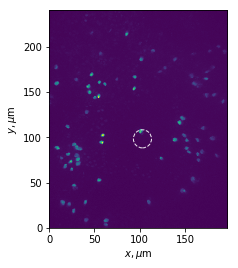

In [9]:
df = tracker.dataframe
source = PointSource(position=np.array([382.91, 365.32])).to_microns(0.269)

pbar = tqdm_notebook(range(121), desc='Generating animation...')
animator(tif, df, source)